# An Interactive Codebook for the Victim-Centered Dataset of U.S. Lynching Newspaper Reports

In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
from collections import Counter
from datetime import datetime as dt
import folium
from folium.plugins import HeatMap
from branca.element import MacroElement
from jinja2 import Template

### 1) Overview

This notebook provides written descriptions of the data columns in our Victim-Centered Dataset of U.S. Lynching Newspaper Reports. It can be used to get a general understanding of our dataset and prepare researchers to apply the dataset in their own work. This interactive codebook also contains code for summary statistics and visualizations, providing cursory examples of the data. To understand the full processes from which the dataset was constructed, visit our [GitHub Repository](https://github.com/MatthewKollmer/us_lynching_victims). There you'll find more information about our data curation pipeline and the larger scope of the project.

If you want to follow along with the code in this notebook, you'll first need to download the data: [download here](https://uofi.app.box.com/folder/311999767132). Downloading currently requires access to our Box folders. To receive access, please [contact Matthew Kollmer](https://matthewkollmer.com/contact/).

<br>

#### Overview Statistics

There are 3,084 Black victims represented in the data. Each lynching victim has their own csv file (that's 3,084 csv files total). These files are kept in our black_victims folder.

In [2]:
directory = 'name_clusters/black_victims'
csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]

print('Number of Victim Clusters:', len(csv_files))
# 3,084 victims in the data

Number of Victim Clusters: 3084


Each csv file has 23 columns. The columns are: victim, race, gender, lynch_date, lynch_location, lynch_latitude, lynch_longitude, newspaper, reprint_date, reprint_longitude, reprint_latitude, clippings, text, probability, BERT_1, BERT_2, BERT_3, violence_word_count, racist_word_count, page_details, url, sn_code, and coverage.

Each section of this notebook will explain a different column in further detail.

In [3]:
example_df = pd.read_csv(f'{directory}/aaron_bean.csv')

print('Columns in the csv files:', example_df.columns.tolist())

Columns in the csv files: ['victim', 'race', 'gender', 'lynch_date', 'lynch_location', 'lynch_latitude', 'lynch_longitude', 'newspaper', 'reprint_date', 'reprint_longitude', 'reprint_latitude', 'clippings', 'text', 'probability', 'BERT_1', 'BERT_2', 'BERT_3', 'violence_word_count', 'racist_word_count', 'page_details', 'url', 'sn_code', 'coverage']


Across all the csv files, there are 376,814 rows–which means there are 376,814 digitized newspaper pages pulled from Chronicling America in the data. It's important to note, however, that not all of these pages reference the victims. Many of them contain coincidental instances of victim's names or fuzzy-matched instances that technically do not contain victim names at all. We've filtered which is which in a variety of ways in subsequent steps described below. Here it's just important to know that there are 376,814 total rows (one row per newspaper page) across 3,084 csv files (one file per lynching victim).

In [4]:
total_rows = 0

for filename in csv_files:
    file_path = os.path.join(directory, filename)
    df = pd.read_csv(file_path)
    total_rows += len(df)
    
print('Total Number of Rows Across All Victim Clusters:', total_rows)
# Total Number of Rows Across All Victim Clusters: 376814

Total Number of Rows Across All Victim Clusters: 376814


The number of rows per csv file vary as well. Some only contain one row, others contain as many as 1,000 rows. This depends on how many times the victim's name appeared in Chronicling America within the year of the lynching and the year after (the established timeframe we used to pull data).

The average number of rows per csv file is 122.18. So, in other words, most of the victim name clusters contain about 122 newspaper pages.

In [5]:
average_rows = total_rows / len(csv_files)
print(f'Average Rows Across All Victim Clusters: {average_rows:.2f}')
# Average Rows Across All Victim Clusters: 122.18

Average Rows Across All Victim Clusters: 122.18


But that's just the mean average of rows per csv file. To understand the distribution of rows across the csv files, you might consider grouping them by their number of rows to get a sense of the median number of rows per file. For example, take a look at Figure 1. It's a bar plot showing groups of csv files defined by their number of rows (i.e. 50 or less rows, 51 to 200 rows, 201 to 500 rows, etc.). As you can see, over half of the victim csv files (1915 precisely) have 50 or less rows of data.

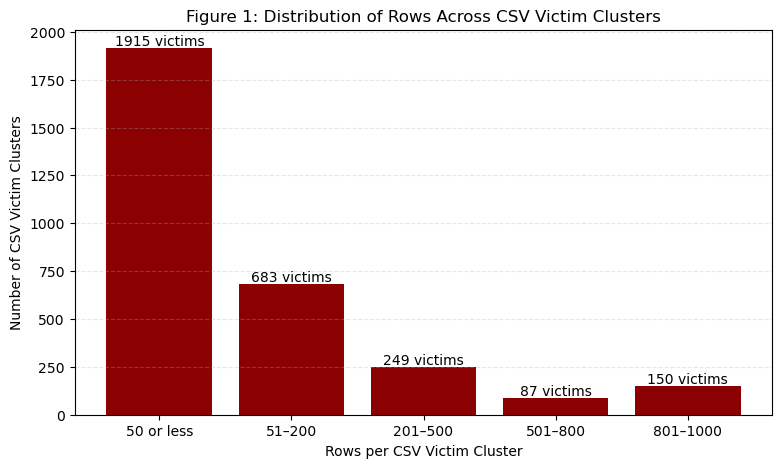

In [6]:
row_counts = []
for filename in csv_files:
    file_path = os.path.join(directory, filename)
    with open(file_path, 'r', encoding='utf-8', errors='ignore') as f:
        n_rows = sum(1 for _ in f) - 1
    row_counts.append(n_rows)

bins   = [(0, 50), (51, 200), (201, 500), (501, 800), (801, 1000)]
labels = ['50 or less', '51–200', '201–500', '501–800', '801–1000']

bin_counts = []
for low, high in bins:
    bin_counts.append(sum(low <= n <= high for n in row_counts))

plt.figure(figsize=(9, 5))
bars = plt.bar(labels, bin_counts, color='darkred')

for bar, count in zip(bars, bin_counts):
    plt.text(bar.get_x() + bar.get_width() / 2, count, f'{count} victims', ha='center', va='bottom')

plt.xlabel('Rows per CSV Victim Cluster')
plt.ylabel('Number of CSV Victim Clusters')
plt.title('Figure 1: Distribution of Rows Across CSV Victim Clusters')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

There are lots of potential reasons for this wide distribution. Some names, for example, are just more common than others, so they appear more often in our subsets of Chronicling America. Consider a name like "General Lee", for instance. It will capture numerous references to the Civil War general as well as references to the lynching victim known as "General Lee." We filter these differences at later steps (see the Probability section below). But when you're looking at all the rows in a csv file, you're looking at every Chronicling America page where the victim's name appears within the established timeframe (the year of the lynching and the year after).

Some lynching cases were also more widely reported in U.S. newspapers. They may have resulted in legal action, further violence, or occurred in more widely covered places. In any case, if the lynching was more widely reported, it will likely have more rows on average in our data.

There may be differences in newspaper coverage over time as well. For example, it's well-documented that Chronicling America has more digitized newspapers from the last decades of the nineteenth century than previous decades (see [Cordell et al.](https://manifold.umn.edu/read/editing-a-paper/section/fc0597a3-5fe1-439c-86f8-0e47e8a55208)). In turn, it's more likely that lynching events later in our overall timeline (1865-1921) will have more hits on average than lynching events from the earliest decades in our timeline.

Finally, as part of our curation pipeline, we excluded cases that contained more than 1,000 Chronicling America search hits. In other words, if a victim's name appeared in Chronicling America more than 1,000 times in the year and year following their lynching, we omitted those cases. There is a clear explanation for this exclusion in [our code](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/02_pull_search_results.ipynb), but essentially, we deduced that these larger search results with 1000+ hits were more than likely full of false positives. Moreover, accounting for them in our scraping process would have added several complicated steps, so we decided not to build them into our pipeline. Still, we documented this choice so others could revisit those victim cases. Doing so will require adapting our pipeline to pull those cases from Chronicling America separately. These cases are listed at the link above.

### 2) Victim

The 'victim' column in every csv has one value: the victim's name. This name was pulled from either the Tolnay-Beck Inventory or the Seguin-Rigby dataset ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/01_unify_data_sources.ipynb) for our process of gathering and unifying this data). Victim names are lowercased. Any punctuation has been removed. Nicknames or aliases are not included. The victim names are the standardized names first listed in the original data sources.

### 3) race

The 'race' column in every csv has one value: the victim's race. The Victim-Centered Dataset of U.S. Newspaper Lynching Reports only includes Black victims, so every value in the 'race' column is 'black'. The race was pulled from either the Tolnay-Beck Inventory or the Seguin-Rigby dataset ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/01_unify_data_sources.ipynb) for our process of gathering and unifying this data). The race label was standardized so any victim that had one or more races listed as 'Black' were included in our data.

### 4) gender

The 'gender' column in every csv has one of two values: 'male' or 'female'. The gender was pulled from either the Tolnay-Beck Inventory or the Seguin-Rigby dataset ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/01_unify_data_sources.ipynb) for our process of gathering and unifying this data).

The vast majority of the victims in the data are labelled male. Specifically, 3002 are labelled male while 82 are labelled female (see Figure 2).

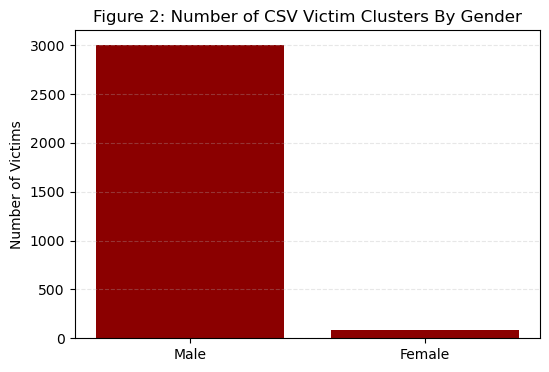

In [7]:
male_count   = 0
female_count = 0

for filename in csv_files:
    path = os.path.join(directory, filename)
    df = pd.read_csv(path, usecols=['gender'])
    genders_in_file = set(df['gender'])
    if 'male' in genders_in_file:
        male_count += 1
    if 'female' in genders_in_file:
        female_count += 1

labels  = ['Male', 'Female']
counts  = [male_count, female_count]

plt.figure(figsize=(6, 4))
bars = plt.bar(labels, counts, color = 'darkred')
plt.ylabel('Number of Victims')
plt.title('Figure 2: Number of CSV Victim Clusters By Gender')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

### 5) lynch_date

The 'lynch_date' column in every csv contains the date of the lynching, if known. Most are formatted 'yyyy-mm-dd'. If known, the date is specified to either the exact day or the month. If the exact date was not known, then the day was labelled as '01'; that is, the first day of the month, to make the data readable with datetime or other date sequencing processes. Any lynch dates listed as occurring on the first of the month should therefore be met with some skepticism.

The lynch_date columns can be used to infer a general timeline of lynchings in our data. For example, see Figure 3. It shows that our data contains a range of cases between 1865 and 1921, with the largest portion in our data occurring between 1885 and 1905.

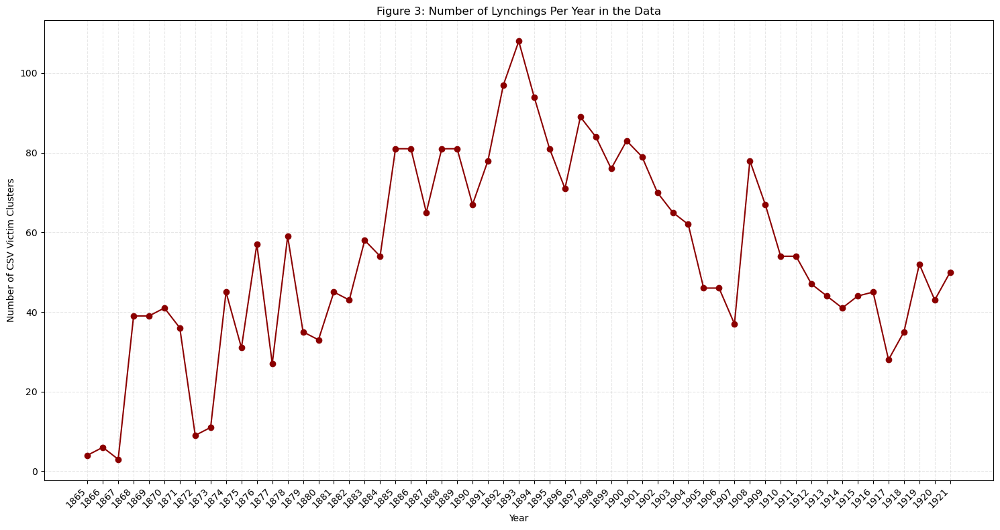

In [8]:
lynch_year_formats = ['%Y-%m-%d', '%m/%d/%y', '%d/%m/%y', '%m/%d/%Y', '%d/%m/%Y', '%Y/%m/%d']

start_year = 1865
end_year = 1921

def parse_year_format(input_date):
    for format in lynch_year_formats:
        try:
            date = dt.strptime(input_date, format).date()
        except ValueError:
            continue
        if date.year > end_year and '%y' in format and date.year - 100 <= end_year:
            date = date.replace(year=date.year - 100)
        if date.year <= end_year:
            return date
    return None

year_file_counts = {y: 0 for y in range(start_year, end_year + 1)}

for filename in csv_files:
    df = pd.read_csv(os.path.join(directory, filename), usecols=['lynch_date'])
    years_in_file = {parse_year_format(v.strip()).year for v in df['lynch_date'].dropna() if parse_year_format(v.strip())}
    
    for year in years_in_file:
        year_file_counts[year] += 1

years  = list(range(start_year, end_year + 1))
counts = [year_file_counts[year] for year in years]

plt.figure(figsize=(15, 8))
plt.plot(years, counts, marker='o', color = 'darkred')
plt.xticks(years, rotation=45, ha='right')
plt.xlabel('Year')
plt.ylabel('Number of CSV Victim Clusters')
plt.title('Figure 3: Number of Lynchings Per Year in the Data')
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

### 6) lynch_location

The 'lynch_location' column in every csv has the city and/or county, and the state location, for every lynching in the data, if known. This location information was pulled from either the Tolnay-Beck Inventory or the Seguin-Rigby dataset ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/01_unify_data_sources.ipynb) for our process of gathering and unifying this data).

Using this information, we were able to compile latitude and longitude data using Nomatim (see lynch_latitude and lynch_longitude sections below).

### 7) lynch_latitude

The 'lynch_latitude' column in every csv contains the latitudinal coordinates of the 'lynch_location', if known. This geospatial information was gathered using Nominatim ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/01_unify_data_sources.ipynb) for our process of gathering and unifying this data). 

Some caveats: Nominatim is not 100% accurate. Sometimes, it misreads location titles. It also relies on modern geospatial maps (OpenStreetMap in particular), so there are some errors in the latitude coordinates. For example, Nominatim consistently mislabels Louisiana parishes. You can account for these mistakes (see code below), but you need to be aware of them. Geospatial data in this column should therefore be reviewed before using it to assume exact locations when such locations are deemed critical for research or analysis.

But when paired with the 'lynch_longitude' column, this data can be used to to create generally accurate geospatial maps of the locations of the lynchings referenced in our data (see Figure 4).

### 8) lynch_longitude

The 'lynch_longitude' column in every csv contains the longitudinal coordinates of the 'lynch_location', if known. This geospatial information was gathered using Nominatim ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/01_unify_data_sources.ipynb) for our process of gathering and unifying this data). 

Some caveats: Nominatim is not 100% accurate. Sometimes, it misreads location titles. It also relies on modern geospatial maps (OpenStreetMap in particular), so there are some errors in the longitude coordinates. For example, Nominatim consistently mislabels Louisiana parishes. You can account for these mistakes (see code below), but you need to be aware of them. Geospatial data in this column should therefore be reviewed before using it to assume exact locations when such locations are deemed critical for research or analysis.

But when paired with the 'lynch_latitude' column, this data can be used to to create generally accurate geospatial maps of the locations of the lynchings referenced in our data (see Figure 4).

In [9]:
louisiana_boundary = {'min_lat': 28.9, 'max_lat': 33.1, 'min_lon': -94.1, 'max_lon': -88.8}

def in_louisiana(lat, lon):
    return (
        louisiana_boundary['min_lat'] <= lat <= louisiana_boundary['max_lat'] and
        louisiana_boundary['min_lon'] <= lon <= louisiana_boundary['max_lon']
    )

master_data = []

for filename in csv_files:
    path = os.path.join(directory, filename)
    df = pd.read_csv(path, usecols=['lynch_latitude', 'lynch_longitude', 'victim', 'lynch_location', 'lynch_date'], dtype=str)
    row = df.iloc[0]

    try:
        lat = float(row['lynch_latitude'])
        lon = float(row['lynch_longitude'])
        
    except (TypeError, ValueError):
        continue

    loc = row.get('lynch_location', '')

    if 'louisiana' in loc and not in_louisiana(lat, lon):
        continue
        
    victim = row.get('victim', 'Unknown Victim')
    date   = row.get('lynch_date', 'Unknown Date')

    master_data.append({'lynch_latitude': lat, 'lynch_longitude': lon, 'victim': victim, 'lynch_location': loc, 'lynch_date': date})

all_coordinates_df = pd.DataFrame(master_data)

map_start_point = [39.8283, -98.5795]

def tweak_coordinates(lat, lon, index, recorded_locations):
    if (lat, lon) in recorded_locations:
        offset = 0.0001 * (index % 10)
        return lat + offset, lon + offset
    else:
        recorded_locations.add((lat, lon))
        return lat, lon

recorded_locations = set()
map = folium.Map(location=map_start_point, tiles='Cartodb Positron', zoom_start=4)

for index, row in all_coordinates_df.iterrows():
    lat_val = row['lynch_latitude']
    lon_val = row['lynch_longitude']

    if pd.isna(lat_val) or pd.isna(lon_val):
        continue

    lat, lon = tweak_coordinates(lat_val, lon_val, index, recorded_locations)

    tooltip = f"<div style='font-size: 11pt'>Victim: {row['victim']}</div>" \
              f"<div style='font-size: 11pt'>Location: {row['lynch_location']}</div>" \
              f"<div style='font-size: 11pt'>Date: {row['lynch_date']}</div>"

    folium.Circle(
        location=[lat, lon],
        tooltip=tooltip,
        color='darkred',
        radius=10
    ).add_to(map)

print('Figure 4: Map of Lynching Locations in the Data')
map

Figure 4: Map of Lynching Locations in the Data


### 9) newspaper

The 'newspaper' column in every csv contains the titles of newspapers for the row's given newspaper page. This data was extracted from the 'page_details' column ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/02_pull_search_results.ipynb) for our process of scraping and gathering this data from Chronicling America).

In total, there are 2,300 newspapers represented in the data.

In [10]:
unique_newspapers = set()

for filename in csv_files:
    path = os.path.join(directory, filename)
    df = pd.read_csv(path, usecols=['newspaper'])
    unique_newspapers.update(df['newspaper'].str.strip())

print(f'Total number of newspapers in the data: {len(unique_newspapers)}')
# Total number of newspapers in the data: 2300

Total number of newspapers in the data: 2300


### 10) reprint_date

The 'reprint_date' column in every csv contains the given row's newspaper issue date in the following format: 'yyyy-mm-dd'. This data was extracted from the 'url' column ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/02_pull_search_results.ipynb) for our process of scraping and gathering this data from Chronicling America).

The 'reprint_date' data can be used to understand newspaper coverage over time. For example, Figure 5 shows that the number of newspaper pages per year in the data follows a similar–although not identical–pattern to the number of lynchings per year seen in Figure 3.

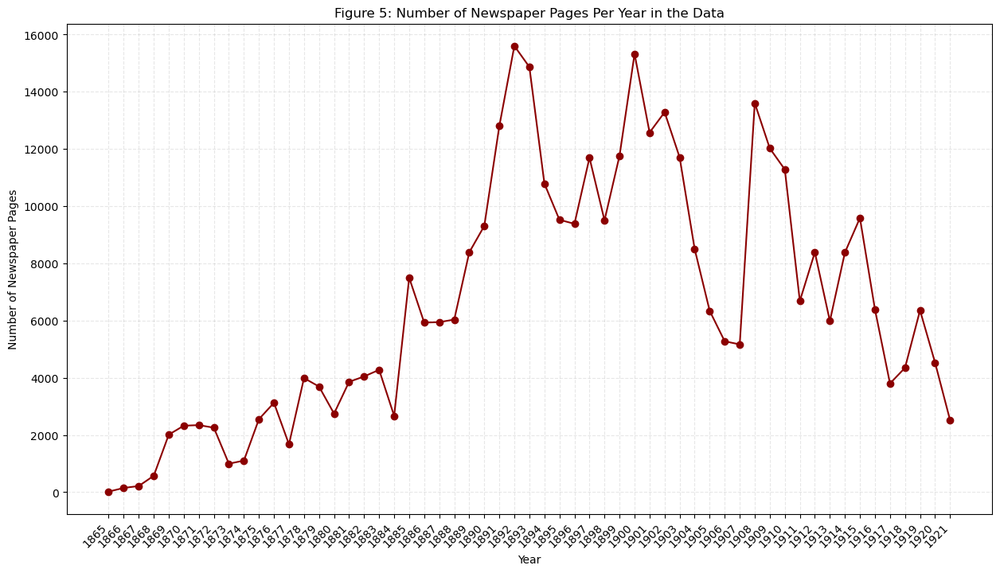

In [11]:
start_year = 1865
end_year = 1921

row_counts_by_year = {year: 0 for year in range(start_year, end_year + 1)}

for filename in csv_files:
    df = pd.read_csv(os.path.join(directory, filename), usecols=['reprint_date'], dtype=str)

    years_series = (df['reprint_date'].str.slice(0, 4).astype(int))

    for year in years_series:
        if start_year <= year <= end_year:
            row_counts_by_year[year] += 1

years  = list(range(start_year, end_year + 1))
counts = [row_counts_by_year[year] for year in years]

plt.figure(figsize=(15, 8))
plt.plot(years, counts, marker='o', color='darkred')
plt.xticks(years, rotation=45, ha='right')
plt.xlabel('Year')
plt.ylabel('Number of Newspaper Pages')
plt.title('Figure 5: Number of Newspaper Pages Per Year in the Data')
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

### 11) reprint_longitude

The 'reprint_longitude' column in every csv contains the longitudinal coordinates for the row's given newspaper. This geospatial information was gathered using the Viral Texts Project's newspaper location data ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/08_enrich_dataset_x2.ipynb) for our processes of adding this data). While most of these latitude and longitude points are accurate, there are exceptions. This is because of discrepancies in newspaper locations cross-referenced with Dbpedia (the geospatial data resource used by the Viral Texts Project). For example, some newspapers are geolocated in Europe when they are in fact U.S.-based newspapers. You can account for these mistakes (see code below), but you need to be aware of them. Geospatial data in this column should therefore be reviewed before using it to assume exact locations when such locations are deemed critical for research or analysis.

But paired with the 'reprint_latitude' column, this data can be used to create generally accurate geospatial maps of page density in the data (see Figure 6), among other things.

### 12) reprint_latitude

The 'reprint_latitude' column in every csv contains the latitudinal coordinates for the row's given newspaper. This geospatial information was gathered using the Viral Texts Project's newspaper location data (see here for our processes of adding this data). While most of these latitude and longitude points are accurate, there are exceptions. This is because of discrepancies in newspaper locations cross-referenced with Dbpedia (the geospatial data resource used by the Viral Texts Project). For example, some newspapers are geolocated in Europe when they are in fact U.S.-based newspapers. You can account for these mistakes (see code below), but you need to be aware of them. Geospatial data in this column should therefore be reviewed before using it to assume exact locations when such locations are deemed critical for research or analysis.

But paired with the 'reprint_longitude' column, this data can be used to create generally accurate geospatial maps of page density in the data (see Figure 6), among other things.

In [12]:
continental_us  = dict(min_lat=24.5, max_lat=49.5,  min_lon=-124.8, max_lon=-66.9)
alaska = dict(min_lat=51.0, max_lat=71.5,  min_lon=-170.0, max_lon=-129.0)
hawaii = dict(min_lat=18.5, max_lat=22.5,  min_lon=-161.0, max_lon=-154.0)

def in_box(lat, lon, box):
    return (box['min_lat'] <= lat <= box['max_lat'] and
            box['min_lon'] <= lon <= box['max_lon'])

def in_usa(lat, lon):
    return (in_box(lat, lon, continental_us) or
            in_box(lat, lon, alaska) or
            in_box(lat, lon, hawaii))

heat_data   = []
row_counter = 0

for filename in csv_files:
    path = os.path.join(directory, filename)
    df = pd.read_csv(path, usecols=['reprint_latitude', 'reprint_longitude'], dtype=str)
    df = df.dropna(subset=['reprint_latitude', 'reprint_longitude'])

    for lat_s, lon_s in zip(df['reprint_latitude'], df['reprint_longitude']):
        try:
            lat = float(lat_s)
            lon = float(lon_s)
            
        except (TypeError, ValueError):
            continue
            
        if in_usa(lat, lon):
            heat_data.append([lat, lon])
            row_counter += 1

map = folium.Map(location=[45, -110], tiles='Cartodb Positron', zoom_start=3)

viridis = {0.0: '#440154', 0.25: '#3B528B', 0.5: '#21918C', 0.75: '#5EC962', 1.0: '#FDE725'}

HeatMap(heat_data, radius=8, blur=4, max_zoom=6, gradient=viridis).add_to(map)

legend_html = """
{% macro html(this, kwargs) %}
<div style='position:fixed; bottom:25px; right:25px; z-index:9999;
            background:#fff; border:1px solid #444; border-radius:4px;
            padding:6px 10px; font-size:12px;'>
  <strong>Newspaper page density</strong><br>
  <svg width='120' height='10'>
    <linearGradient id='grad'>
      <stop offset='0%'   stop-color='#440154'/>
      <stop offset='25%'  stop-color='#3B528B'/>
      <stop offset='50%'  stop-color='#21918C'/>
      <stop offset='75%'  stop-color='#5EC962'/>
      <stop offset='100%' stop-color='#FDE725'/>
    </linearGradient>
    <rect width='120' height='10' fill='url(#grad)'/>
  </svg><br>
  <span style='float:left;'>Low</span>
  <span style='float:right;'>High</span>
</div>
{% endmacro %}
"""

legend = MacroElement()
legend._template = Template(legend_html)
map.get_root().add_child(legend)

pages_per_coordinate = Counter(tuple(point) for point in heat_data)

for (lat, lon), n in pages_per_coordinate.items():
    folium.CircleMarker(
        location=[lat, lon],
        radius=3,
        color='transparent',
        tooltip=f'{n} newspaper pages'
    ).add_to(map)

print('Figure 6: Heatmap of Newspaper Page Locations in the Data')
map

Figure 6: Heatmap of Newspaper Page Locations in the Data


### 13) clippings

The 'clippings' column in every csv contains the OCR-generated text surrounding the victim's name on the given newspaper page. More specifically, the 'clippings' contain the 50 words preceding the victim's name and the 100 words after the victim's name. If the victim's name appears more than once on a given page, then multiple clippings are grouped together in the row and separated by 'END CLIPPING | START CLIPPING' ([See here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/04_enrich_dataset.ipynb) for the processes we used to extract these clippings from the newspaper text).

Because newspaper pages were identified using Chronicling America's fuzzy-matched search results, some rows do not contain clippings (see Figure 7).

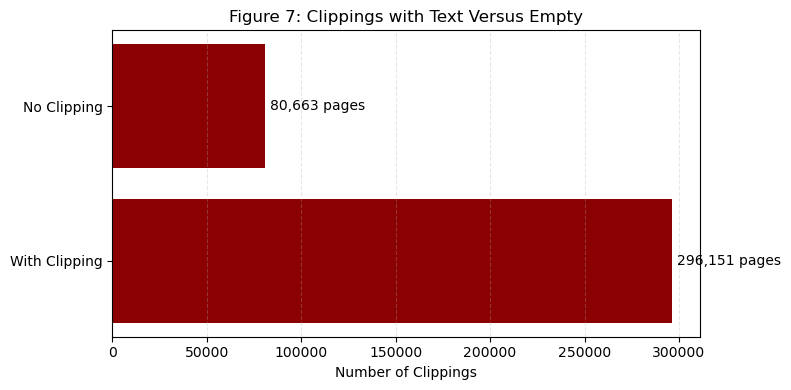

In [13]:
has_clipping = 0
no_clipping  = 0

for filename in csv_files:
    path = os.path.join(directory, filename)
    df = pd.read_csv(path, usecols=['clippings'], dtype=str)
    clipping_mask = df['clippings'].notna() & df['clippings'].str.strip().ne('')
    has_clipping += clipping_mask.sum()
    no_clipping  += (~clipping_mask).sum()

labels  = ['With Clipping', 'No Clipping']
counts  = [has_clipping, no_clipping]

plt.figure(figsize=(8, 4))
bars = plt.barh(labels, counts, color='darkred')

for bar, count in zip(bars, counts):
    plt.text(count + max(counts)*0.01,
             bar.get_y() + bar.get_height()/2,
             f'{count:,} pages',
             va='center')

plt.xlabel('Number of Clippings')
plt.title('Figure 7: Clippings with Text Versus Empty')
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

### 14) text

The 'text' column in every csv contains the OCR-generated full text from the given newspaper page. Every row contains this OCR-generated text ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/03_scrape_search_results.ipynb) for our process of scraping this OCR text from Chronicling America).

### 15) probability

The 'probability' column in every csv provides labels that indicate whether the corresponding clipping contains reference to a lynching or not. The probability labels are 'high', 'medium', 'low', 'unlikely', and 'unknown'. These labels, in other words, indicate which clippings our model has identified as lynching reports.

We trained BERT to identify lynching reports and used its predictions to infer the probability labels. We ran the model three times and assigned our probability labels based on BERT's consistency of prediction (as either 'yes': the clipping contains reference to a lynching, or 'no': the clipping does not contain reference to a lynching). Each probability label, in other words, means the following:

- 'high': over three iterations, BERT labelled the clipping as 'yes' (the clipping contains reference to a lynching) each time
- 'medium': over three iterations, BERT labelled the clipping as 'yes' (the clipping contains reference to a lynching) two out of three times
- 'low': over three iterations, BERT labelled the clipping as 'yes' (the clipping contains reference to a lynching) one out of three times
- 'unlikely': over three iterations, BERT labelled the clipping as 'yes' (the clipping contains reference to a lynching) zero out of three times
- 'unknown': the clipping does not contain text, so BERT could not make predictions

Figure 8 shows the distribution of our probability labels. The column descriptions for BERT_1, BERT_2, and BERT_3 also provide accuracy reports for each iteration of the model. [See here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/07_BERT_classifier.ipynb) for our processes of training and implementing BERT.

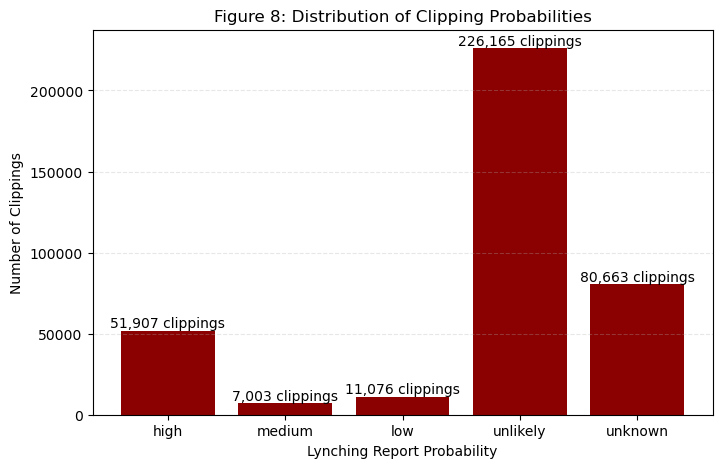

In [14]:
counts = Counter()

for filename in csv_files:
    path = os.path.join(directory, filename)
    df = pd.read_csv(path, usecols=['probability'], dtype=str)
    counts.update(df['probability'])

labels  = ['high', 'medium', 'low', 'unlikely', 'unknown']
values  = [counts[label] for label in labels]

plt.figure(figsize=(8, 5))
bars = plt.bar(labels, values, color='darkred')

for bar, count in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width()/2,
             count,
             f'{count:,} clippings',
             ha='center',
             va='bottom')

plt.xlabel('Lynching Report Probability')
plt.ylabel('Number of Clippings')
plt.title('Figure 8: Distribution of Clipping Probabilities')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

### 16) BERT_1

The 'BERT_1' column in every csv contains the first iteration of BERT's labels from the binary classification task of predicting whether clippings contain reference to a lynching or not. The labels are:

- 'yes': the clipping contains reference to a lynching
- 'no': the clipping does not contain reference to a lynching

We trained and tested BERT before implementing it on the data. The BERT_1 iteration of training and testing had the following accuracy scores:

          precision    recall  f1-score   support

      no       0.99      0.93      0.96       161
     yes       0.77      0.95      0.85        39
     accuracy                      0.94       200

[See here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/07_BERT_classifier.ipynb) for our processes of training and implementing BERT.

### 17) BERT_2

The 'BERT_2' column in every csv contains the second iteration of BERT's labels from the binary classification task of predicting whether clippings contain reference to a lynching or not. The labels are:

- 'yes': the clipping contains reference to a lynching
- 'no': the clipping does not contain reference to a lynching

We trained and tested BERT before implementing it on the data. The BERT_2 iteration of training and testing had the following accuracy scores:

          precision    recall  f1-score   support

      no       0.99      0.92      0.95       161
     yes       0.74      0.95      0.83        39
     accuracy                      0.93       200

[See here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/07_BERT_classifier.ipynb) for our processes of training and implementing BERT.

### 18) BERT_3

The 'BERT_3' column in every csv contains the third iteration of BERT's labels from the binary classification task of predicting whether clippings contain reference to a lynching or not. The labels are:

- 'yes': the clipping contains reference to a lynching
- 'no': the clipping does not contain reference to a lynching

We trained and tested BERT before implementing it on the data. The BERT_3 iteration of training and testing had the following accuracy scores:

          precision    recall  f1-score   support

      no       1.00      0.94      0.97       161
     yes       0.81      1.00      0.90        39
     accuracy                      0.95       200

[See here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/07_BERT_classifier.ipynb) for our processes of training and implementing BERT.

### 19) violence_word_count

The 'violence_word_count' column in every csv contains the number of violence-related words in the corresponding clipping. Our violence-related lexicon includes the following:

- 'lynch'
- 'mob'
- 'murder'
- 'posse'
- 'hang'
- 'hung'
- 'burn'
- 'shot'
- 'gun'
- 'stab'
- 'cut'
- 'bayonet'
- 'bullet'
- 'drown'
- 'beat'
- 'whip'
- 'assault'
- 'death'
- 'jail'
- 'prison'

This data can be used in a variety of ways, including comparing the word frequencies to the clipping probabilities (see Figure 9). To learn more about the processes used to count violence words, [see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/04_enrich_dataset.ipynb).

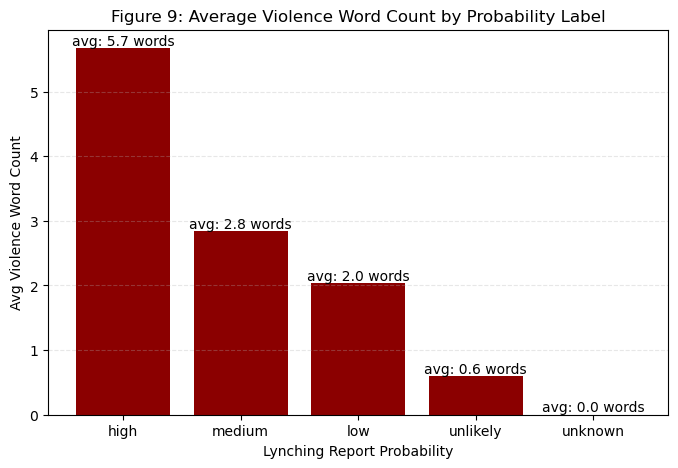

In [15]:
probability_violence_compare = []

for filename in csv_files:
    path = os.path.join(directory, filename)
    df   = pd.read_csv(path, usecols=['probability', 'violence_word_count'], dtype={'probability': str, 'violence_word_count': 'Int64'})
    probability_violence_compare.append(df)

master_df = pd.concat(probability_violence_compare, ignore_index=True)

avg_counts = (master_df.assign(probability=master_df['probability']).groupby('probability')['violence_word_count'].mean())

labels  = ['high', 'medium', 'low', 'unlikely', 'unknown']
means   = [avg_counts.get(label, 0) for label in labels]

plt.figure(figsize=(8, 5))
bars = plt.bar(labels, means, color='darkred')

for bar, mean in zip(bars, means):
    plt.text(bar.get_x() + bar.get_width()/2,
             mean,
             f'avg: {mean:.1f} words',
             ha='center',
             va='bottom')

plt.xlabel('Lynching Report Probability')
plt.ylabel('Avg Violence Word Count')
plt.title('Figure 9: Average Violence Word Count by Probability Label')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

### 20) racist_word_count

TRIGGER WARNING: the racist word lexicon below contains highly offensive language.

The 'racist_word_count' column in every csv contains the number of racist words in the corresponding clipping. Our racist-word lexicon includes the following:

- 'negro'
- 'colored'
- 'black'
- 'nigger'
- 'negroid'
- 'mulatto'
- 'african'
- 'coon'

This data can be used in a variety of ways, including comparing the word frequencies to the clipping probabilities (see Figure 10). To learn more about the processes used to count racist words, [see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/04_enrich_dataset.ipynb).

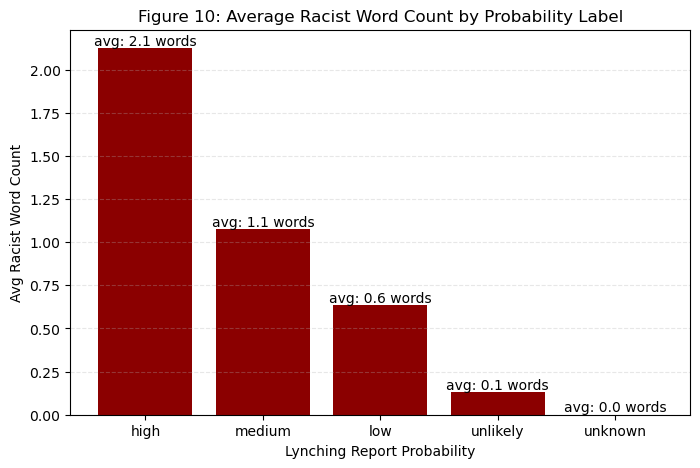

In [16]:
probability_racist_compare = []

for filename in csv_files:
    path = os.path.join(directory, filename)
    df   = pd.read_csv(path, usecols=['probability', 'racist_word_count'], dtype={'probability': str, 'racist_word_count': 'Int64'})
    probability_racist_compare.append(df)

master_df = pd.concat(probability_racist_compare, ignore_index=True)

avg_counts = (master_df.assign(probability=master_df['probability']).groupby('probability')['racist_word_count'].mean())

labels  = ['high', 'medium', 'low', 'unlikely', 'unknown']
means   = [avg_counts.get(label, 0) for label in labels]

plt.figure(figsize=(8, 5))
bars = plt.bar(labels, means, color='darkred')

for bar, mean in zip(bars, means):
    plt.text(bar.get_x() + bar.get_width()/2,
             mean,
             f'avg: {mean:.1f} words',
             ha='center',
             va='bottom')

plt.xlabel('Lynching Report Probability')
plt.ylabel('Avg Racist Word Count')
plt.title('Figure 10: Average Racist Word Count by Probability Label')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()

### 21) page_details

The 'page_details' column contains Chronicling America's newspaper page information for the given row. This information includes:

- newspaper title
- newspaper city & state
- newspaper date
- image number

This information is provided exactly as it is listed in Chronicling America's search results. That is, it includes punctuation, state abbreviation variations, and other separators. [See here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/02_pull_search_results.ipynb) for our processes of scraping this information from Chronicling America.

### 22) url

The 'url' column in every csv contains the Chronicling America URL associated with the OCR text for the given newspaper page. Using this URL, users can more easily review the full newspaper page and find the scanned image version. [See here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/03_scrape_search_results.ipynb) for our processes of scraping this OCR text from Chronicling America.

### 23) sn_code

The 'sn_code' column in every csv contains the Chronicling America unique code for the given newspaper title. Chronicling America assigns these codes to its digitized newspapers for organizational purposes. The codes are included in the Chronicling America URL to the given newspaper, which is how we extracted them.

[See here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/08_enrich_dataset_x2.ipynb) for our processes of extracting the newspaper sn code from the Chronicling America URL.

### 24) coverage

The 'coverage' column in every csv contains the dbpedia link to the associated newspaper location. These links were cross-referenced with the sn_code to get the latitude and longitude for the given newspaper ([see here](https://github.com/MatthewKollmer/us_lynching_victims/blob/main/08_enrich_dataset_x2.ipynb) for our processes of cross-referencing sn_code, coverage, and reprint_latitude/reprint_longitude).